In [2]:
import sys
import keras
import cv2
import numpy
import matplotlib
import skimage
print(sys.version)
print(keras.__version__)
print(cv2.__version__)
print(numpy.__version__)
print(matplotlib.__version__)
print(skimage.__version__)

3.6.12 |Anaconda, Inc.| (default, Sep  9 2020, 00:29:25) [MSC v.1916 64 bit (AMD64)]
2.3.1
4.4.0
1.19.4
3.3.2
0.17.2


In [3]:
from keras.models import Sequential
from keras.layers import Conv2D,Input
from keras.optimizers import SGD,Adam
from skimage.measure import compare_ssim as ssim
from matplotlib import pyplot as plt
import math
import os
import numpy as np
%matplotlib inline

In [28]:
def psnr(target,reference):
    target_data=target.astype(float)
    ref_data=reference.astype(float)
    z=ref_data-target_data
    z.flatten('C')
    rmse=math.sqrt(np.mean(z**2))
    return 20*math.log10(255/rmse)
def mse(target,reference):
    target_data=target.astype(float)
    ref_data=reference.astype(float)
    z=ref_data-target_data
    z.flatten('C')
    return (np.sum(z**2))/(target.shape[0]*target.shape[1])
def compare_images(target,reference):
    return [psnr(target,reference),mse(target,reference),ssim(target,reference,multichannel=True)]


In [29]:
def prepare_images(path,factor):
    for file in os.listdir(path):
        img=cv2.imread(path+'/'+file)
        h,w,c=img.shape
        new_h=h//factor
        new_w=w//factor
        img=cv2.resize(img,(new_w,new_h),interpolation=cv2.INTER_LINEAR)
        img=cv2.resize(img,(w,h),interpolation=cv2.INTER_LINEAR)
        cv2.imwrite("new_images/{}".format(file),img)
        

In [30]:
prepare_images("allimages",2) 

In [31]:
for file in os.listdir('new_images'):
    target=cv2.imread("new_images/{}".format(file))
    ref=cv2.imread("allimages/{}".format(file))
    scores=compare_images(target,ref)
    print(scores)

C:\Users\kaustubh\AppData\Roaming\Python\Python36\site-packages\ipykernel_launcher.py:15: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  from ipykernel import kernelapp as app


[22.157084083442548, 1187.1161333333334, 0.629277587900277]
[34.37180640966199, 71.28874588012695, 0.9356987872724932]
[25.906629837568126, 500.65508535879627, 0.8098632646406401]
[32.896644728720005, 100.12375819830247, 0.9533644866026473]
[24.782076560337416, 648.6254119873047, 0.8791344763843051]
[27.161600663887082, 375.00887784090907, 0.756950063354931]
[23.799861502225532, 813.2338836565096, 0.8347335416398209]
[30.99220650287191, 155.23189718546524, 0.8008439492289884]
[27.454504805386147, 350.55093922651935, 0.8697286286974628]
[30.14456532664372, 188.6883483270202, 0.933268417388899]
[31.020502848237534, 154.2237755102041, 0.8011121330733371]
[31.47349297867539, 138.94800567626953, 0.8460989200521499]
[30.196242365288896, 186.45643615722656, 0.9439574293434104]
[29.88947161686106, 200.1033935546875, 0.8357937568464359]
[24.84926168950471, 638.6684263912582, 0.9284023942315316]
[29.326236280817465, 227.812729498164, 0.9335397280466592]
[27.909840639329513, 315.6585459528818, 0.

In [47]:
def model():
    SRCNN=Sequential()
    SRCNN.add(Conv2D(filters=128,kernel_size=(9,9),kernel_initializer="glorot_uniform",activation="relu",padding="valid",bias=True,input_shape=(None,None,1)))
    SRCNN.add(Conv2D(filters=64,kernel_size=(3,3),kernel_initializer="glorot_uniform",activation="relu",padding="same",bias=True))
    SRCNN.add(Conv2D(filters=1,kernel_size=(5,5),kernel_initializer="glorot_uniform",activation="linear",padding="same",bias=True))
    adam=Adam(lr=0.0003)
    SRCNN.compile(optimizer=adam,loss="mean_squared_error",metrics=["mean_squared_error"])
    return SRCNN

In [64]:
def modcrop(img,scale):
    tempsz=img.shape
    sz=tempsz[0:2]
    sz-=np.mod(sz,scale)
    img=img[0:sz[0],1:sz[1]]
    return img
def shave(img,border):
    image=img[border:-border,border:-border]
    return image

In [73]:
def predict_images(image_path):
    srcnn=model()
    srcnn.load_weights("3051crop_weight_200.h5")
    path,file=os.path.split(image_path)
    degraded=cv2.imread(image_path)
    ref=cv2.imread("allimages/{}".format(file))
    ref=modcrop(ref,3)
    degraded=modcrop(degraded,3)
    temp=cv2.cvtColor(degraded,cv2.COLOR_BGR2YCrCb)
    Y=np.zeros((1,temp.shape[0],temp.shape[1],1),dtype=float)
    Y[0,:,:,0]=(temp[:,:,0].astype(float))/255
    pre=srcnn.predict(Y,batch_size=1)
    pre*=255
    pre[pre[:]>255]=255
    pre[pre[:]<0]=0
    pre=pre.astype(np.uint8)
    temp=shave(temp,4)
    temp[:,:,0]=pre[0,:,:,0]
    output=cv2.cvtColor(temp,cv2.COLOR_YCrCb2BGR)
    ref=shave(ref.astype(np.uint8),4)
    degraded=shave(degraded.astype(np.uint8),4)
    scores=[]
    scores.append(compare_images(degraded,ref))
    scores.append(compare_images(output,ref))
    return ref,degraded,output,scores

C:\Users\kaustubh\AppData\Roaming\Python\Python36\site-packages\ipykernel_launcher.py:3: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(filters=128, kernel_size=(9, 9), kernel_initializer="glorot_uniform", activation="relu", padding="valid", input_shape=(None, Non..., use_bias=True)`
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\kaustubh\AppData\Roaming\Python\Python36\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(filters=64, kernel_size=(3, 3), kernel_initializer="glorot_uniform", activation="relu", padding="same", use_bias=True)`
  after removing the cwd from sys.path.
C:\Users\kaustubh\AppData\Roaming\Python\Python36\site-packages\ipykernel_launcher.py:5: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(filters=1, kernel_size=(5, 5), kernel_initializer="glorot_uniform", activation="linear", padding="same", use_bias=True)`
  """
C:\Users\kaust

[[27.294254996433665, 363.7274818739543, 0.869199567928709], [29.193886065122822, 234.86213747908533, 0.894652246024554]]


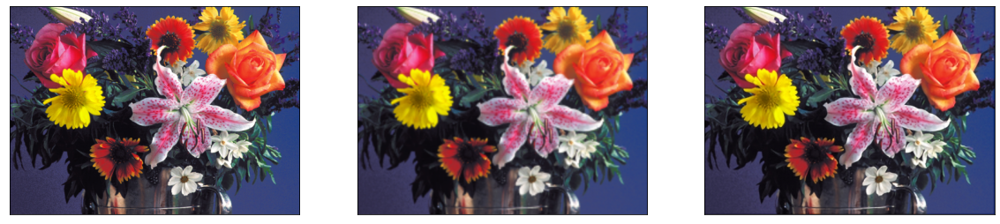

In [75]:
ref,degraded,output,scores=predict_images("new_images/flowers.bmp")
print(scores)
fig,axes=plt.subplots(1,3,figsize=(20,8))
axes[0].imshow(cv2.cvtColor(ref,cv2.COLOR_BGR2RGB))
axes[1].imshow(cv2.cvtColor(degraded,cv2.COLOR_BGR2RGB))
axes[2].imshow(cv2.cvtColor(output,cv2.COLOR_BGR2RGB))
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    

C:\Users\kaustubh\AppData\Roaming\Python\Python36\site-packages\ipykernel_launcher.py:3: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(filters=128, kernel_size=(9, 9), kernel_initializer="glorot_uniform", activation="relu", padding="valid", input_shape=(None, Non..., use_bias=True)`
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\kaustubh\AppData\Roaming\Python\Python36\site-packages\ipykernel_launcher.py:4: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(filters=64, kernel_size=(3, 3), kernel_initializer="glorot_uniform", activation="relu", padding="same", use_bias=True)`
  after removing the cwd from sys.path.
C:\Users\kaustubh\AppData\Roaming\Python\Python36\site-packages\ipykernel_launcher.py:5: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(filters=1, kernel_size=(5, 5), kernel_initializer="glorot_uniform", activation="linear", padding="same", use_bias=True)`
  """
C:\Users\kaust

[[22.29113359441073, 1151.0342752417594, 0.6319492504295338], [22.793647351305534, 1025.2667671831132, 0.7058992012779473]]
[[34.28061569136798, 72.80145287115013, 0.9347622345225051], [28.47103411977775, 277.39472847134414, 0.9476333608915435]]
[[25.92563249014114, 498.46924337869694, 0.8097599377248924], [26.443411557890283, 442.44619015074977, 0.8547429903788132]]
[[32.96562418387137, 98.546044546851, 0.9533488540988454], [31.251293472248463, 146.24205069124423, 0.9629722960209689]]
[[24.736019115843245, 655.5407656100853, 0.8787386836168255], [28.16428840845582, 297.6958460880155, 0.9456644395777972]]
[[27.240102159707615, 368.29124895572266, 0.7529855266879473], [26.3686257699949, 450.13111946533, 0.8216299947906348]]
[[23.68430032862095, 835.1636482007576, 0.8311458604768395], [24.39678378141915, 708.7992305871212, 0.8950414653720801]]
[[30.916372297231234, 157.966278159763, 0.800252405102723], [28.67032290224145, 264.9532953211471, 0.8220025442031861]]
[[27.294254996433665, 363.

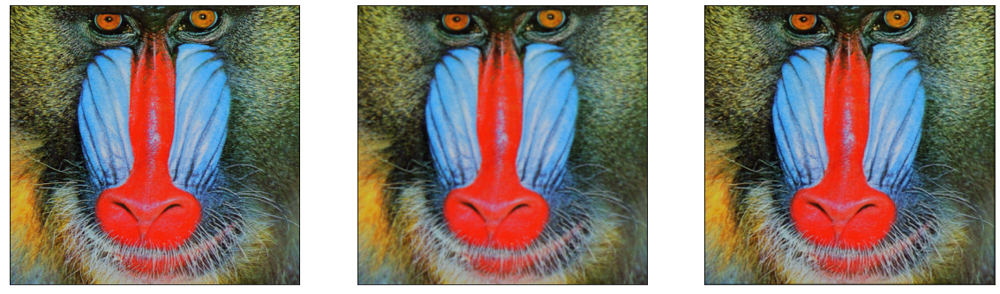

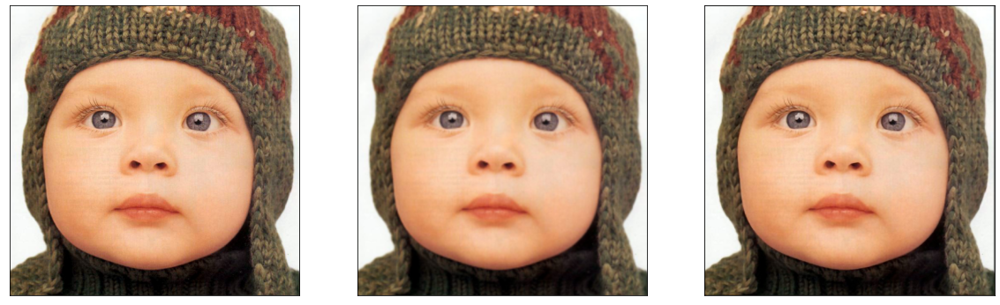

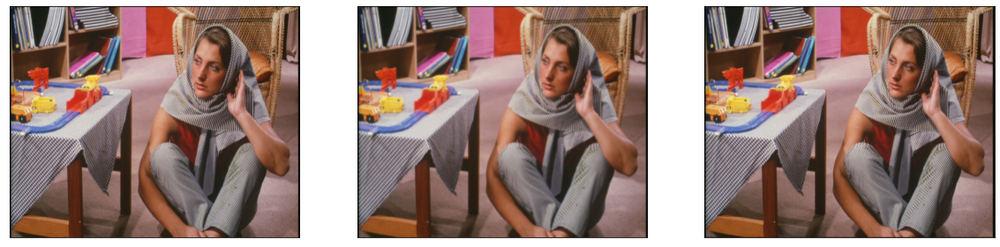

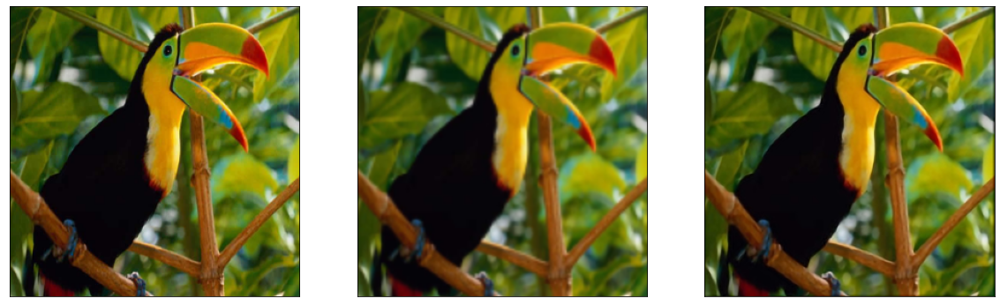

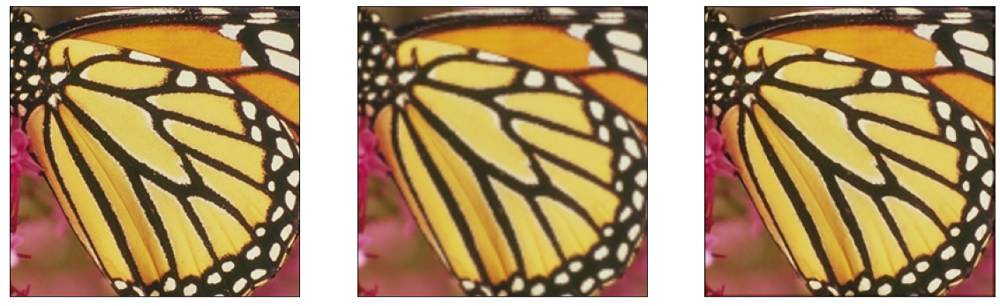

...

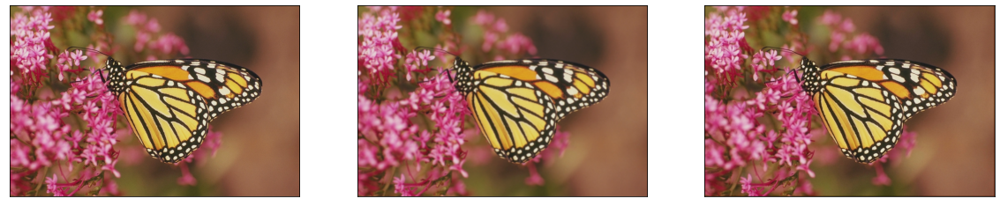

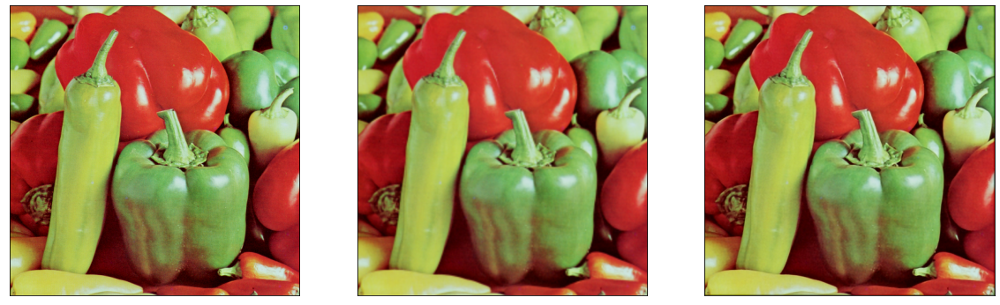

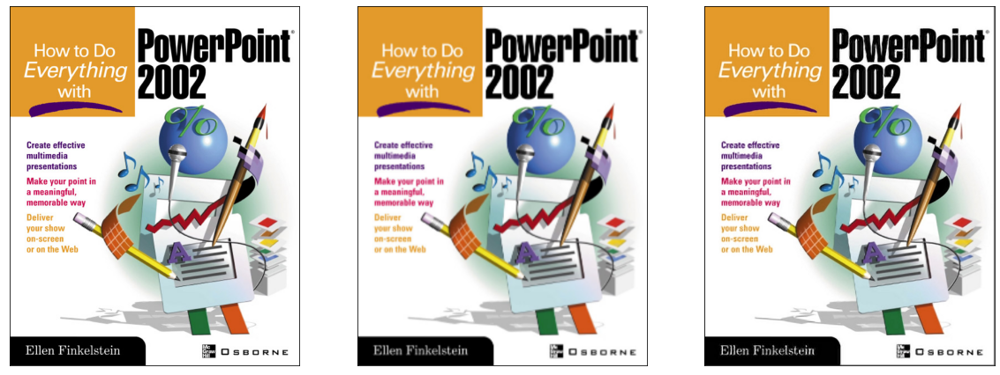

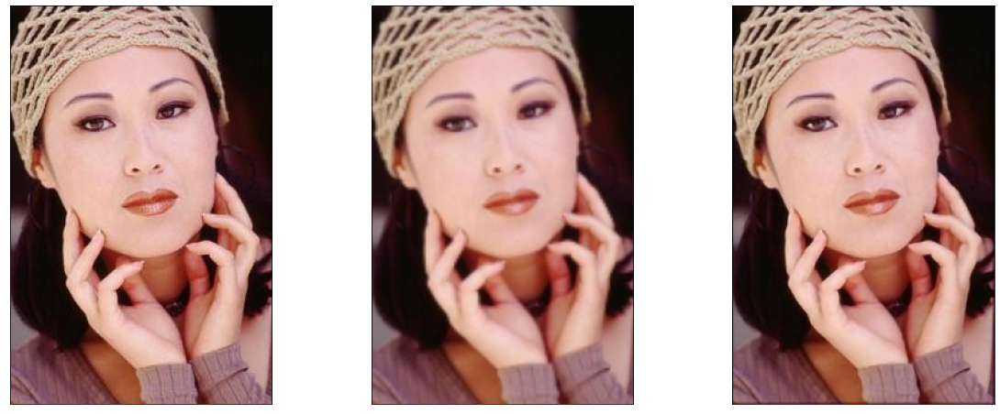

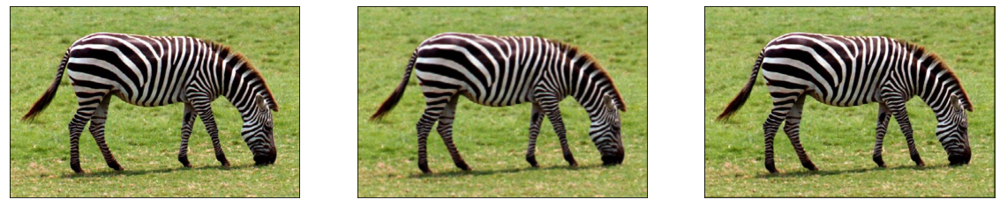

In [76]:
for file in os.listdir("new_images"):
    ref,degraded,output,scores=predict_images("new_images/"+file)
    print(scores)
    fig,axes=plt.subplots(1,3,figsize=(20,8))
    axes[0].imshow(cv2.cvtColor(ref,cv2.COLOR_BGR2RGB))
    axes[1].imshow(cv2.cvtColor(degraded,cv2.COLOR_BGR2RGB))
    axes[2].imshow(cv2.cvtColor(output,cv2.COLOR_BGR2RGB))
    for ax in axes:
        ax.set_xticks([])
        ax.set_yticks([])
    